In [1]:
library(IRdisplay)
display_html("<style>.container { width:100% !important; }</style>")

.libPaths()

[1] "/hps/software/users/marioni/Leah/miniconda3/envs/basic_renv/lib/R/library"

In [2]:
suppressPackageStartupMessages(library(data.table))
suppressPackageStartupMessages(library(ggplot2))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(viridis))
suppressPackageStartupMessages(library(matrixStats))
suppressPackageStartupMessages(library(optparse))
suppressPackageStartupMessages(library(edgeR))
suppressPackageStartupMessages(library(tibble))
suppressPackageStartupMessages(library(scales))

source('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/gastruloids_scRNAseq/plotting_settings.R')

In [3]:
opts <- list()
outbase <- "/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/heterogeneity_simulations/20220628/"
sim_types <- c('full')
timepoints <- c('d4.5')
DA_meths <- c('poisson', 'NB', 'Deconv')
ct_perturbs <- c('', 'Anterior Primitive Streak', 'Cardiopharyngeal Mesoderm', 'Caudal Epiblast',
                 'Caudal Neurectoderm', 'Early Anterior PSM', 'Early Nascent Mesoderm', 'Early Neurectoderm',
                 'Early Posterior PSM', 'Early Spinal Cord', 'Endothelium', 'Epiblast', 'Head Mesoderm',
                 'Late Anterior PSM', 'Late Nascent Mesoderm', 'Late Neurectoderm', 'Late Posterior PSM',
                 'Late Spinal Cord', 'Mature Endoderm', 'Mature Somites', 'NMPs', 'Neurons', 'Notochord','PGCs',
                 'Primitive Streak', 'Somites' )

In [4]:
#for (da_meth in DA_meths) {
#    for (ct in ct_perturbs) {
#        f <- paste0(outbase,'gastr_sim_', da_meth, '_', ct, '_out.txt.gz')
#        tmp <- fread(f)
#        if (exists("out")) {
#            out <- rbind(out, tmp, fill=TRUE)
#        } else {
#            out <- tmp
#        }
#    }
#}
#out[(FDR < 0.2) & (Pval < 0.05), discovery := TRUE]
#fwrite(out, "/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/heterogeneity_simulations/20220628/gastr_sim_out.txt.gz")
out <- fread("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/heterogeneity_simulations/20220628/gastr_sim_out.txt.gz")

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



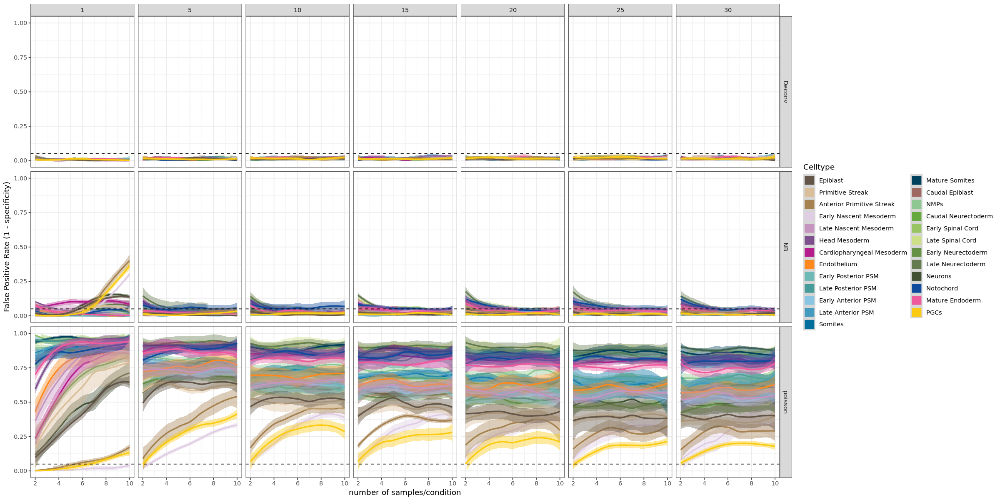

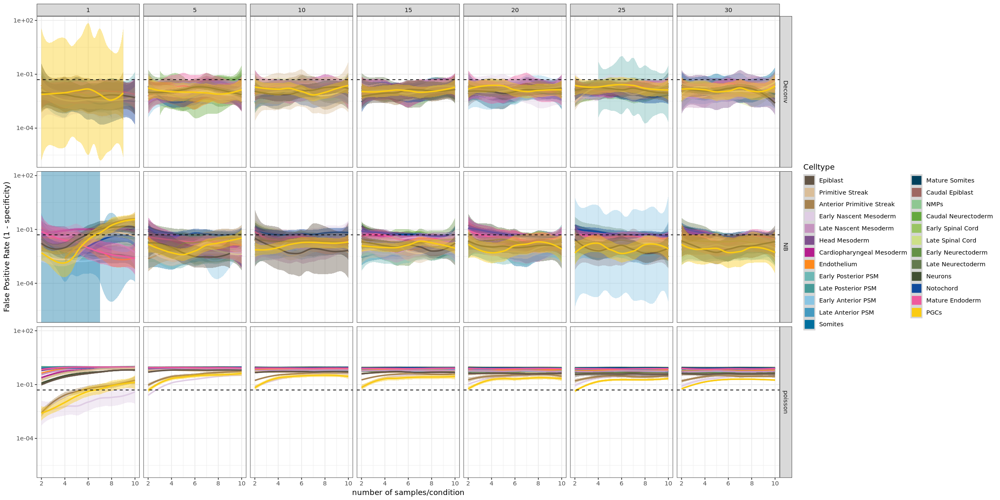

In [5]:
options(warn=-1)

cols <- c('ct_perturb', 'celltype', 'IoD', 'IoD_contr', 'sim_type', 'cells_per_samp',
          'timepoint', 'DA_meth', 'norg', 'nsamp'#, 'fc_ct'
         )
to.plot <- copy(out)
to.plot <- to.plot[ct_perturb == "",
               FPR := mean(discovery),
               by=cols
              ]
to.plot <- to.plot[ct_perturb == "", .SD, .SDcols=c('FPR',cols)] %>% unique
to.plot$celltype <- factor(to.plot$celltype, levels = rev(cluster_order))
options(repr.plot.width=20, repr.plot.height=10)
p <- ggplot(data=to.plot, mapping = aes(x=nsamp, y=FPR, colour=celltype)) +
  #geom_line() +
  geom_smooth(se=TRUE, mapping = aes(fill=celltype)) +
  ylim(0,1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  scale_colour_manual(values = cluster_colours, name = "Celltype") +
  labs(x="number of samples/condition", y="False Positive Rate (1 - specificity)") +
  scale_fill_manual(values = cluster_colours) +
  geom_hline(yintercept = 0.05, linetype='dashed') +
  guides(colour = guide_legend(override.aes = list(size=6)), fill="none") +
  theme_bw() +
  #theme(legend.position = 'None') +
  facet_grid(DA_meth~norg)
print(p)
p <- ggplot(data=to.plot, mapping = aes(x=nsamp, y=FPR, colour=celltype)) +
  #geom_line() +
  geom_smooth(se=TRUE, mapping = aes(fill=celltype)) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  scale_colour_manual(values = cluster_colours, name = "Celltype") +
  labs(x="number of samples/condition", y="False Positive Rate (1 - specificity)") +
  scale_fill_manual(values = cluster_colours) +
  geom_hline(yintercept = 0.05, linetype='dashed') +
  guides(colour = guide_legend(override.aes = list(size=6)), fill="none") +
  scale_y_continuous(trans='log10') +
  theme_bw() +
  #theme(legend.position = 'None') +
  facet_grid(DA_meth~norg)
print(p)

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



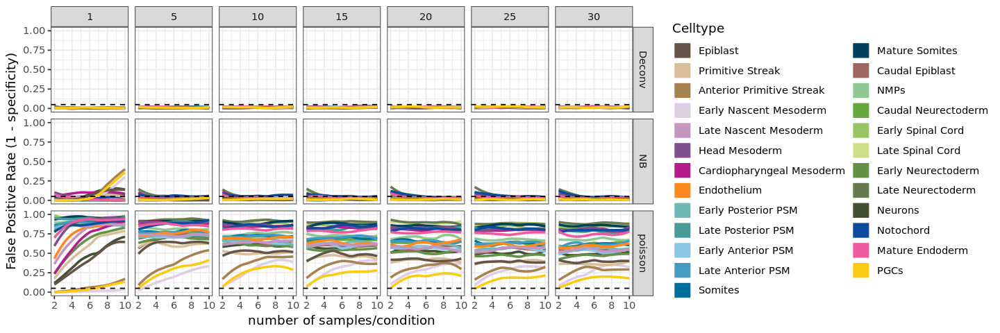

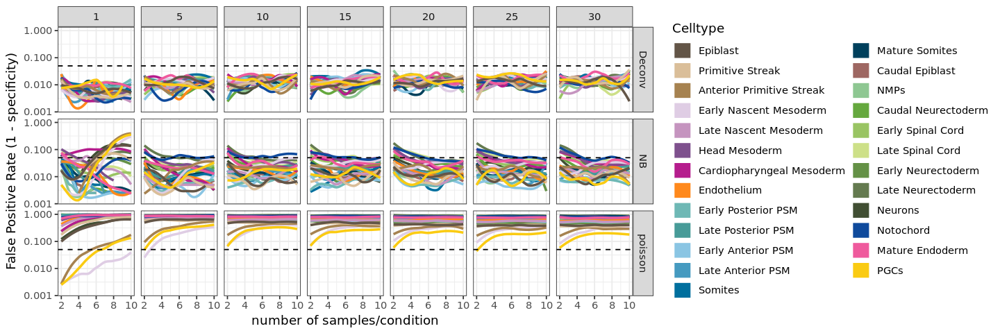

In [6]:
options(repr.plot.width=12, repr.plot.height=4)
p <- ggplot(data=to.plot, mapping = aes(x=nsamp, y=FPR, colour=celltype)) +
  #geom_line() +
  #geom_smooth(se=TRUE, mapping = aes(fill=celltype)) +
  geom_smooth(se=FALSE, mapping = aes(fill=celltype)) +
  ylim(0,1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  scale_colour_manual(values = cluster_colours, name = "Celltype") +
  labs(x="number of samples/condition", y="False Positive Rate (1 - specificity)") +
  scale_fill_manual(values = cluster_colours) +
  geom_hline(yintercept = 0.05, linetype='dashed') +
  guides(colour = guide_legend(override.aes = list(size=6)), fill="none") +
  theme_bw() +
  #theme(legend.position = 'None') +
  facet_grid(DA_meth~norg)
print(p)
p <- ggplot(data=to.plot, mapping = aes(x=nsamp, y=FPR, colour=celltype)) +
  #geom_line() +
  #geom_smooth(se=TRUE, mapping = aes(fill=celltype)) +
  geom_smooth(se=FALSE, mapping = aes(fill=celltype)) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  scale_colour_manual(values = cluster_colours, name = "Celltype") +
  labs(x="number of samples/condition", y="False Positive Rate (1 - specificity)") +
  scale_fill_manual(values = cluster_colours) +
  geom_hline(yintercept = 0.05, linetype='dashed') +
  guides(colour = guide_legend(override.aes = list(size=6)), fill="none") +
  scale_y_continuous(trans='log10') +
  theme_bw() +
  #theme(legend.position = 'None') +
  facet_grid(DA_meth~norg)
print(p)

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



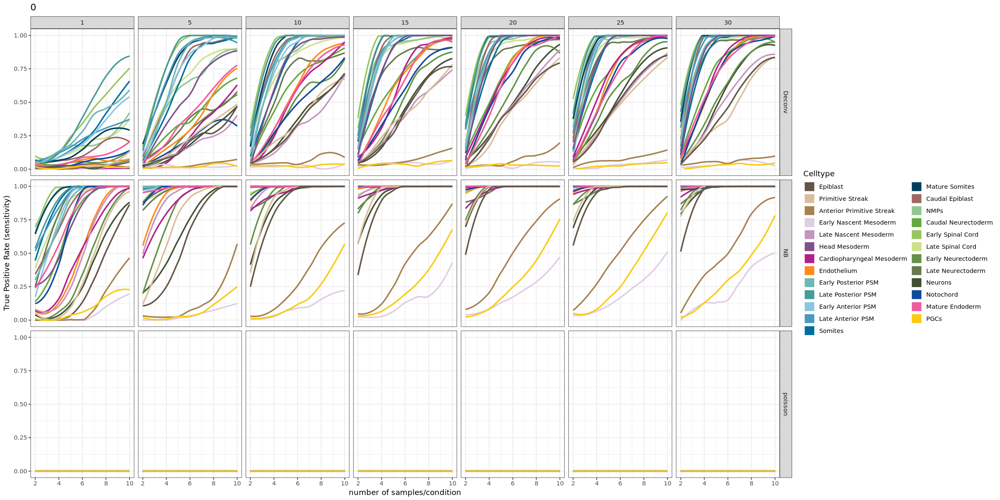

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



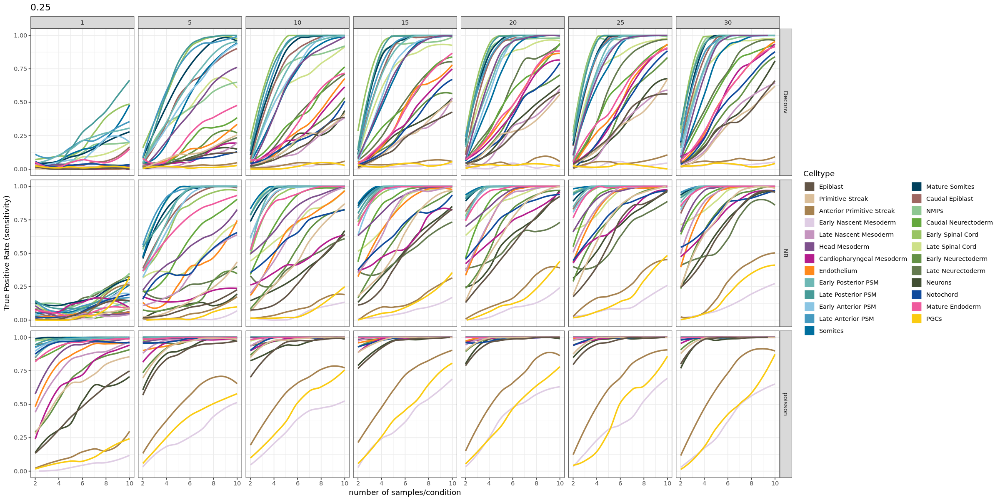

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



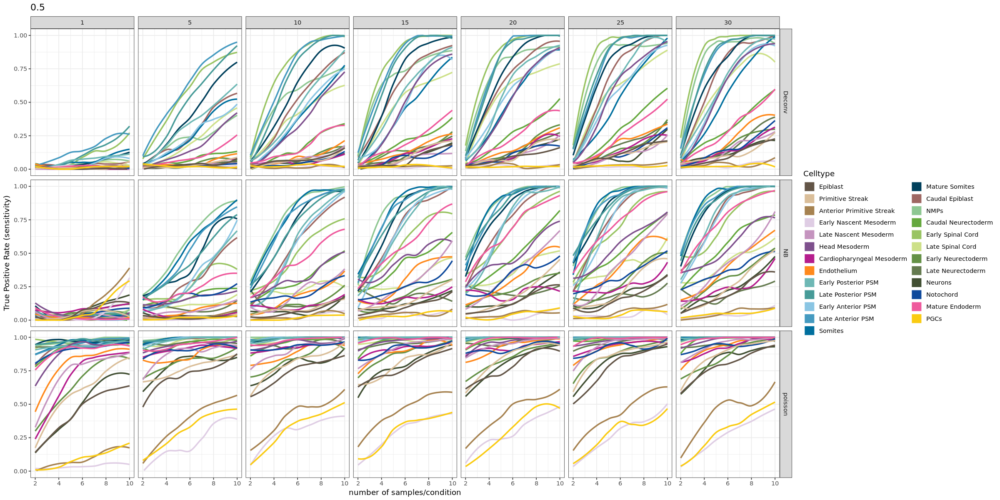

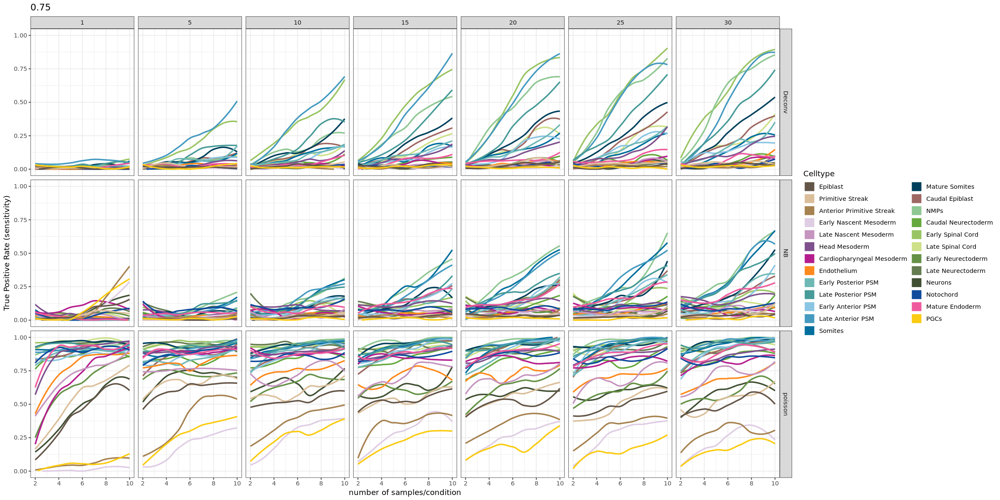

In [7]:
options(warn=-1)

cols <- c('ct_perturb', 'celltype', 'IoD', 'IoD_contr', 'sim_type', 'cells_per_samp',
          'timepoint', 'DA_meth', 'norg', 'nsamp', 'fc'
         )
to.plot <- copy(out)
to.plot <- to.plot[ct_perturb == celltype,
               TPR := mean(discovery),
               by=cols
              ]
to.plot <- to.plot[ct_perturb == celltype, .SD, .SDcols=c('TPR',cols)] %>% unique
to.plot$celltype <- factor(to.plot$celltype, levels = rev(cluster_order))
options(repr.plot.width=20, repr.plot.height=10)
for (foldchange in unique(to.plot$fc)) {
    p <- ggplot(data=to.plot[fc == foldchange], mapping = aes(x=nsamp, y=TPR, colour=celltype)) +
      #geom_line() +
      #geom_smooth(se=TRUE, mapping = aes(fill=celltype)) +
      geom_smooth(se=FALSE, mapping = aes(fill=celltype)) +
      ylim(0,1) +
      # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
      scale_colour_manual(values = cluster_colours, name = "Celltype") +
      labs(x="number of samples/condition", y="True Positive Rate (sensitivity)") +
      scale_fill_manual(values = cluster_colours) +
      #geom_hline(yintercept = 0.05, linetype='dashed') +
      ggtitle(foldchange) +
      guides(colour = guide_legend(override.aes = list(size=6)), fill="none") +
      theme_bw() +
      #theme(legend.position = 'None') +
      facet_grid(DA_meth~norg)
    print(p)
}

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



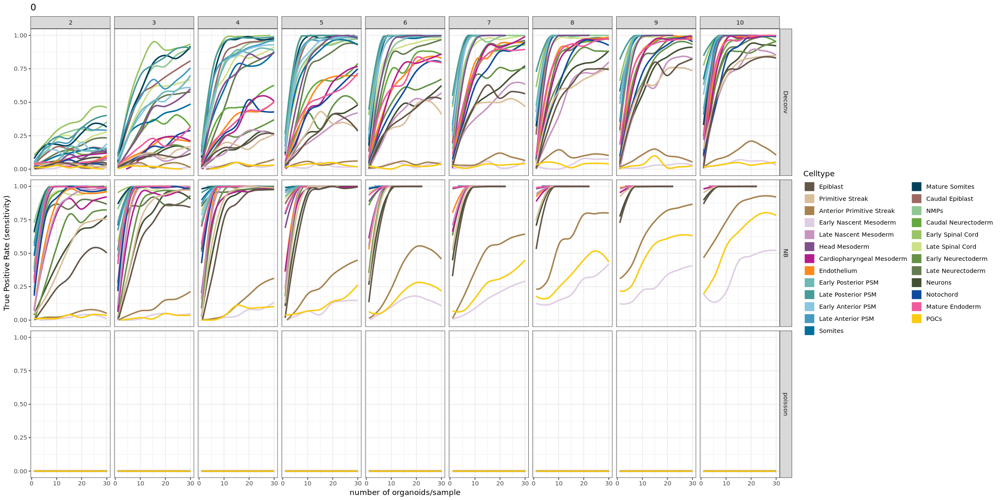

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



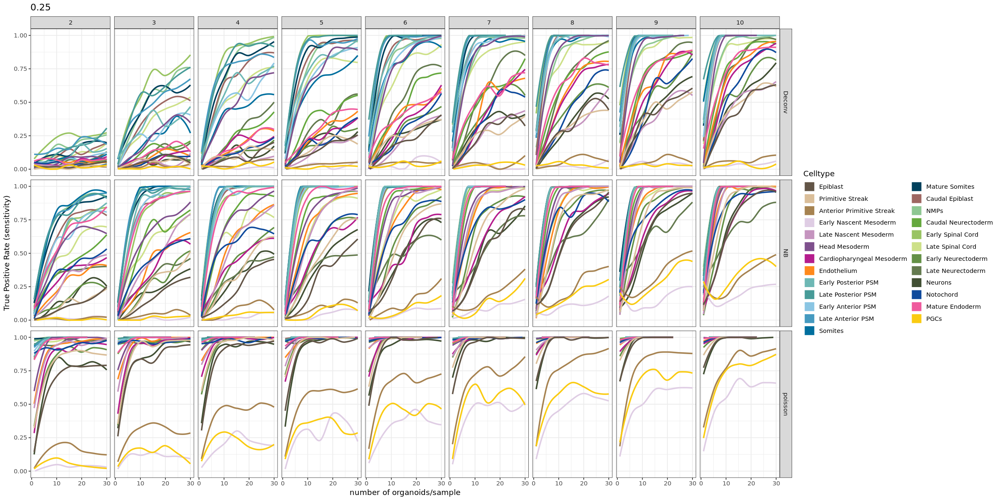

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



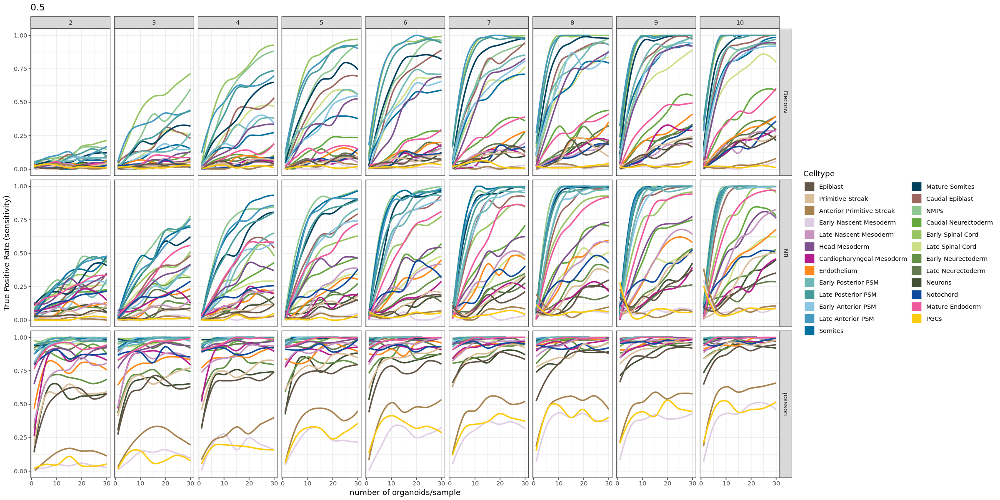

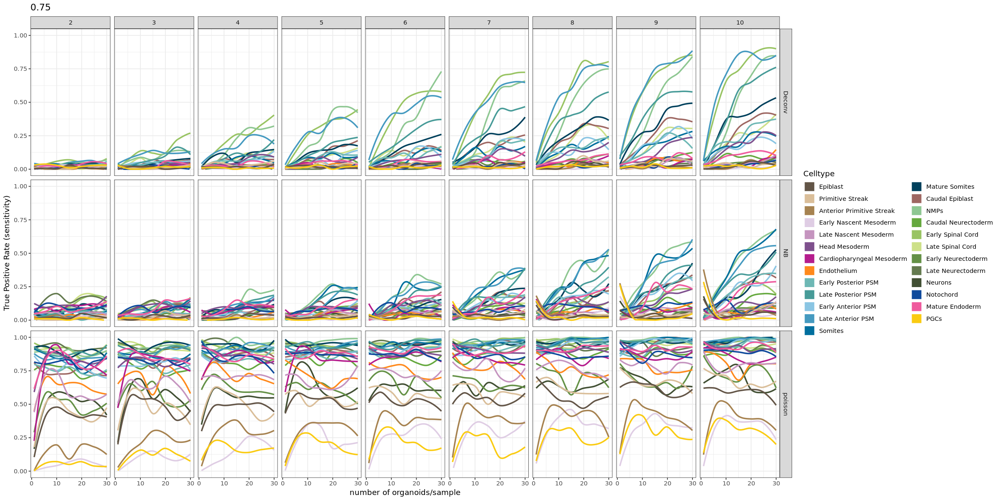

In [8]:
options(warn=-1)

cols <- c('ct_perturb', 'celltype', 'IoD', 'IoD_contr', 'sim_type', 'cells_per_samp',
          'timepoint', 'DA_meth', 'norg', 'nsamp', 'fc'
         )
to.plot <- copy(out)
to.plot <- to.plot[ct_perturb == celltype,
               TPR := mean(discovery),
               by=cols
              ]
to.plot <- to.plot[ct_perturb == celltype, .SD, .SDcols=c('TPR',cols)] %>% unique
to.plot$celltype <- factor(to.plot$celltype, levels = rev(cluster_order))
options(repr.plot.width=20, repr.plot.height=10)
for (foldchange in unique(to.plot$fc)) {
    p <- ggplot(data=to.plot[fc == foldchange], mapping = aes(x=norg, y=TPR, colour=celltype)) +
      #geom_line() +
      #geom_smooth(se=TRUE, mapping = aes(fill=celltype)) +
      geom_smooth(se=FALSE, mapping = aes(fill=celltype)) +
      ylim(0,1) +
      # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
      scale_colour_manual(values = cluster_colours, name = "Celltype") +
      labs(x="number of organoids/sample", y="True Positive Rate (sensitivity)") +
      scale_fill_manual(values = cluster_colours) +
      #geom_hline(yintercept = 0.05, linetype='dashed') +
      ggtitle(foldchange) +
      guides(colour = guide_legend(override.aes = list(size=6)), fill="none") +
      theme_bw() +
      #theme(legend.position = 'None') +
      facet_grid(DA_meth~nsamp)
    print(p)
}

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



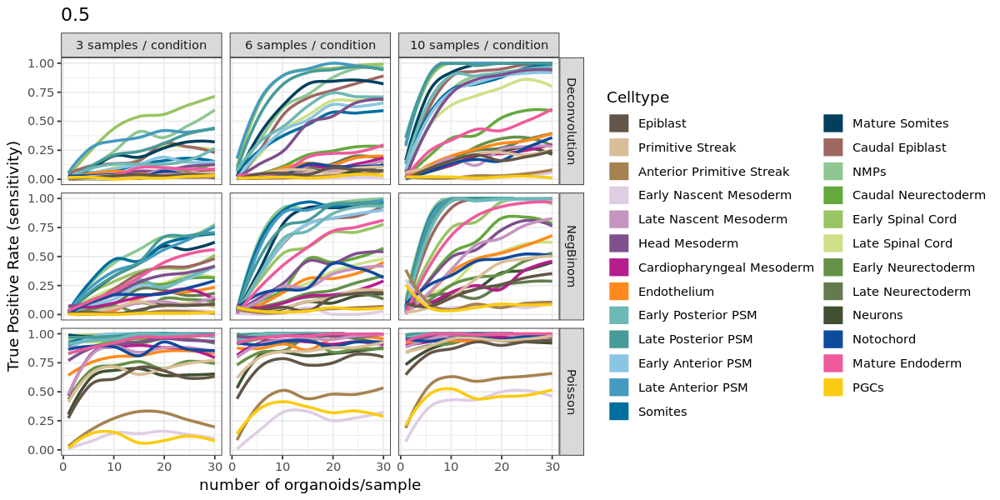

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



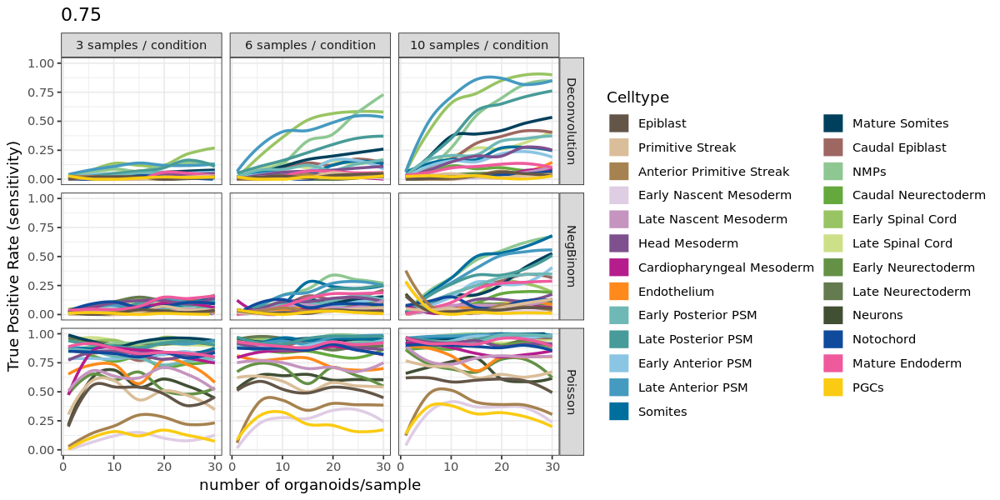

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



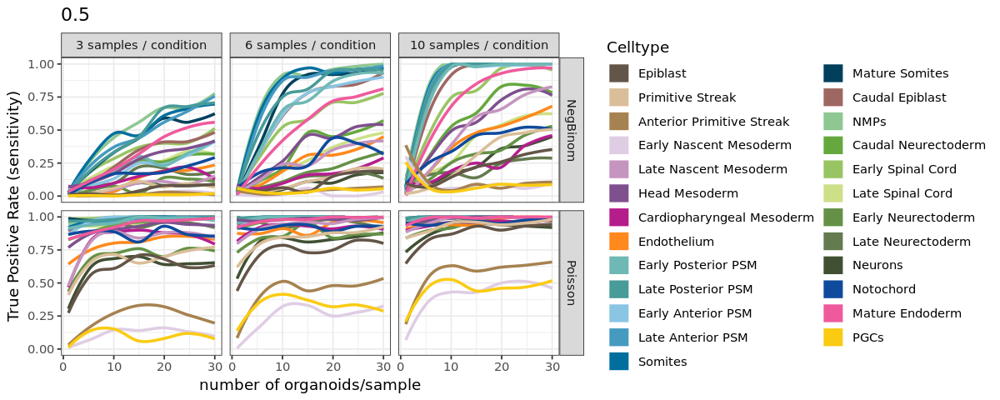

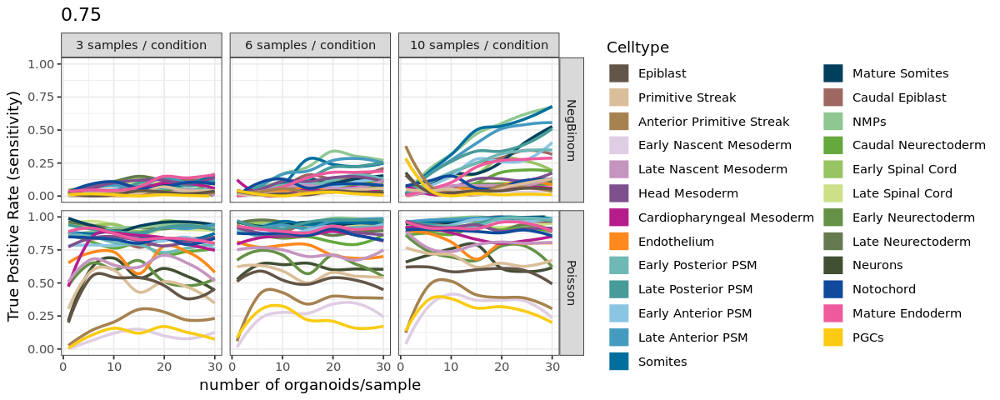

In [9]:
nsamp.labs <- c("3" = "3 samples / condition",
                  "6" = "6 samples / condition",
                  "10" = "10 samples / condition"
                 )
DA_meth.labs <- c("Deconv" = "Deconvolution",
                  "NB" = "NegBinom",
                  "poisson" = "Poisson"
                 )

options(repr.plot.width=10, repr.plot.height=5)
cols <- c('ct_perturb', 'celltype', 'IoD', 'IoD_contr', 'sim_type', 'cells_per_samp',
          'timepoint', 'DA_meth', 'norg', 'nsamp', 'fc'
         )
to.plot <- copy(out)
to.plot <- to.plot[ct_perturb == celltype,
               TPR := mean(discovery),
               by=cols
              ]
to.plot <- to.plot[ct_perturb == celltype, .SD, .SDcols=c('TPR',cols)] %>% unique
to.plot$celltype <- factor(to.plot$celltype, levels = rev(cluster_order))
p <- ggplot(data=to.plot[(fc == 0.5) & (nsamp %in% c(3, 6, 10))], mapping = aes(x=norg, y=TPR, colour=celltype)) +
  #geom_line() +
  #geom_smooth(se=TRUE, mapping = aes(fill=celltype)) +
  geom_smooth(se=FALSE, mapping = aes(fill=celltype)) +
  ylim(0,1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  scale_colour_manual(values = cluster_colours, name = "Celltype") +
  labs(x="number of organoids/sample", y="True Positive Rate (sensitivity)") +
  scale_fill_manual(values = cluster_colours) +
  #geom_hline(yintercept = 0.05, linetype='dashed') +
  ggtitle(0.5) +
  guides(colour = guide_legend(override.aes = list(size=6)), fill="none") +
  theme_bw() +
  #theme(legend.position = 'None') +
  facet_grid(DA_meth~nsamp, labeller = labeller(DA_meth = DA_meth.labs, nsamp = nsamp.labs))
print(p)
ggsave(
  paste0('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/final_plots/Fig4/D.pdf'),
  plot = p,
  device = 'pdf',
      width = 10,
  height = 5,
  units = "in"
)

p <- ggplot(data=to.plot[(fc == 0.75) & (nsamp %in% c(3, 6, 10))], mapping = aes(x=norg, y=TPR, colour=celltype)) +
  #geom_line() +
  #geom_smooth(se=TRUE, mapping = aes(fill=celltype)) +
  geom_smooth(se=FALSE, mapping = aes(fill=celltype)) +
  ylim(0,1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  scale_colour_manual(values = cluster_colours, name = "Celltype") +
  labs(x="number of organoids/sample", y="True Positive Rate (sensitivity)") +
  scale_fill_manual(values = cluster_colours) +
  #geom_hline(yintercept = 0.05, linetype='dashed') +
  ggtitle(0.75) +
  guides(colour = guide_legend(override.aes = list(size=6)), fill="none") +
  theme_bw() +
  #theme(legend.position = 'None') +
  facet_grid(DA_meth~nsamp, labeller = labeller(DA_meth = DA_meth.labs, nsamp = nsamp.labs))
print(p)
ggsave(
  paste0('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/final_plots/Fig4/E.pdf'),
  plot = p,
  device = 'pdf',
      width = 10,
  height = 5,
  units = "in"
)

options(repr.plot.width=10, repr.plot.height=4)
p <- ggplot(data=to.plot[(fc == 0.5) & (nsamp %in% c(3, 6, 10)) & (DA_meth %in% c('NB', 'poisson'))], mapping = aes(x=norg, y=TPR, colour=celltype)) +
  #geom_line() +
  #geom_smooth(se=TRUE, mapping = aes(fill=celltype)) +
  geom_smooth(se=FALSE, mapping = aes(fill=celltype)) +
  ylim(0,1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  scale_colour_manual(values = cluster_colours, name = "Celltype") +
  labs(x="number of organoids/sample", y="True Positive Rate (sensitivity)") +
  scale_fill_manual(values = cluster_colours) +
  #geom_hline(yintercept = 0.05, linetype='dashed') +
  ggtitle(0.5) +
  guides(colour = guide_legend(override.aes = list(size=6)), fill="none") +
  theme_bw() +
  #theme(legend.position = 'None') +
  facet_grid(DA_meth~nsamp, labeller = labeller(DA_meth = DA_meth.labs, nsamp = nsamp.labs))
print(p)

p <- ggplot(data=to.plot[(fc == 0.75) & (nsamp %in% c(3, 6, 10)) & (DA_meth %in% c('NB', 'poisson'))], mapping = aes(x=norg, y=TPR, colour=celltype)) +
  #geom_line() +
  #geom_smooth(se=TRUE, mapping = aes(fill=celltype)) +
  geom_smooth(se=FALSE, mapping = aes(fill=celltype)) +
  ylim(0,1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  scale_colour_manual(values = cluster_colours, name = "Celltype") +
  labs(x="number of organoids/sample", y="True Positive Rate (sensitivity)") +
  scale_fill_manual(values = cluster_colours) +
  #geom_hline(yintercept = 0.05, linetype='dashed') +
  ggtitle(0.75) +
  guides(colour = guide_legend(override.aes = list(size=6)), fill="none") +
  theme_bw() +
  #theme(legend.position = 'None') +
  facet_grid(DA_meth~nsamp, labeller = labeller(DA_meth = DA_meth.labs, nsamp = nsamp.labs))
print(p)

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



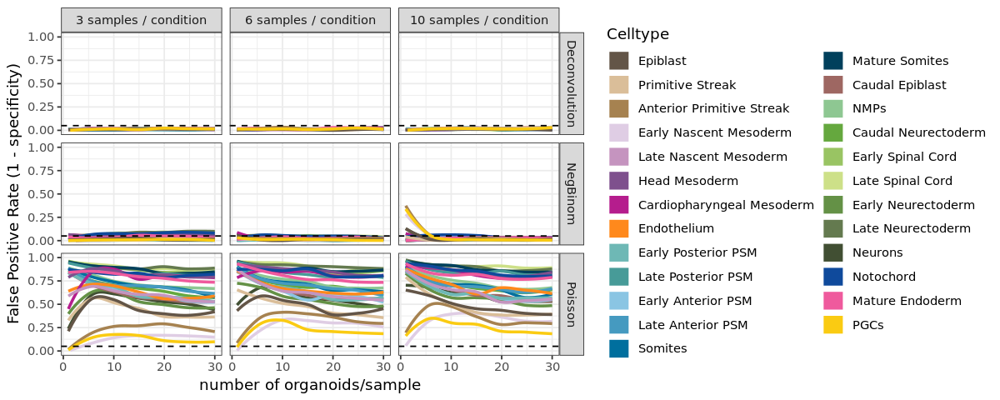

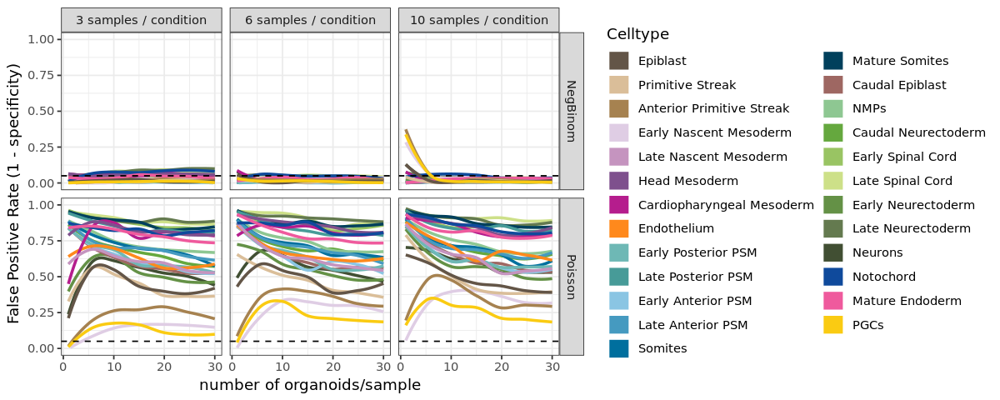

In [10]:
nsamp.labs <- c("3" = "3 samples / condition",
                  "6" = "6 samples / condition",
                  "10" = "10 samples / condition"
                 )
DA_meth.labs <- c("Deconv" = "Deconvolution",
                  "NB" = "NegBinom",
                  "poisson" = "Poisson"
                 )

options(repr.plot.width=10, repr.plot.height=4)
cols <- c('ct_perturb', 'celltype', 'IoD', 'IoD_contr', 'sim_type', 'cells_per_samp',
          'timepoint', 'DA_meth', 'norg', 'nsamp'#, 'fc_ct'
         )
to.plot <- copy(out)
to.plot <- to.plot[ct_perturb == "",
               FPR := mean(discovery),
               by=cols
              ]
to.plot <- to.plot[ct_perturb == "", .SD, .SDcols=c('FPR',cols)] %>% unique
to.plot$celltype <- factor(to.plot$celltype, levels = rev(cluster_order))
p <- ggplot(data=to.plot[(nsamp %in% c(3, 6, 10))], mapping = aes(x=norg, y=FPR, colour=celltype)) +
  #geom_line() +
  #geom_smooth(se=TRUE, mapping = aes(fill=celltype)) +
  geom_smooth(se=FALSE, mapping = aes(fill=celltype)) +
  ylim(0,1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  scale_colour_manual(values = cluster_colours, name = "Celltype") +
  labs(x="number of organoids/sample", y="False Positive Rate (1 - specificity)") +
  scale_fill_manual(values = cluster_colours) +
  geom_hline(yintercept = 0.05, linetype='dashed') +
  guides(colour = guide_legend(override.aes = list(size=6)), fill="none") +
  theme_bw() +
  #theme(legend.position = 'None') +
  facet_grid(DA_meth~nsamp, labeller = labeller(DA_meth = DA_meth.labs, nsamp = nsamp.labs))
print(p)
ggsave(
  paste0('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/final_plots/Fig4/C.pdf'),
  plot = p,
  device = 'pdf',
      width = 10,
  height = 5,
  units = "in"
)

options(repr.plot.width=10, repr.plot.height=4)
p <- ggplot(data=to.plot[(nsamp %in% c(3, 6, 10)) & (DA_meth %in% c('NB', 'poisson'))], mapping = aes(x=norg, y=FPR, colour=celltype)) +
  #geom_line() +
  #geom_smooth(se=TRUE, mapping = aes(fill=celltype)) +
  geom_smooth(se=FALSE, mapping = aes(fill=celltype)) +
  ylim(0,1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  scale_colour_manual(values = cluster_colours, name = "Celltype") +
  labs(x="number of organoids/sample", y="False Positive Rate (1 - specificity)") +
  scale_fill_manual(values = cluster_colours) +
  geom_hline(yintercept = 0.05, linetype='dashed') +
  guides(colour = guide_legend(override.aes = list(size=6)), fill="none") +
  theme_bw() +
  #theme(legend.position = 'None') +
  facet_grid(DA_meth~nsamp, labeller = labeller(DA_meth = DA_meth.labs, nsamp = nsamp.labs))
print(p)

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



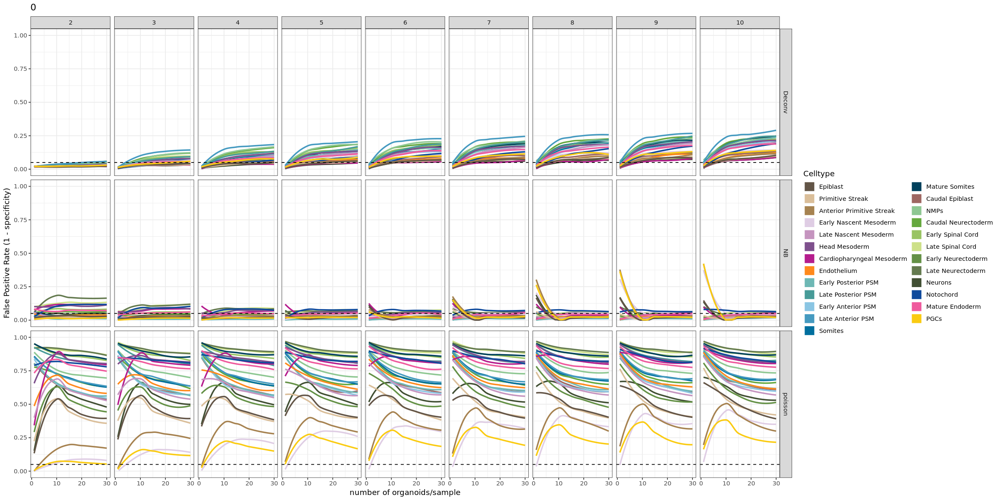

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



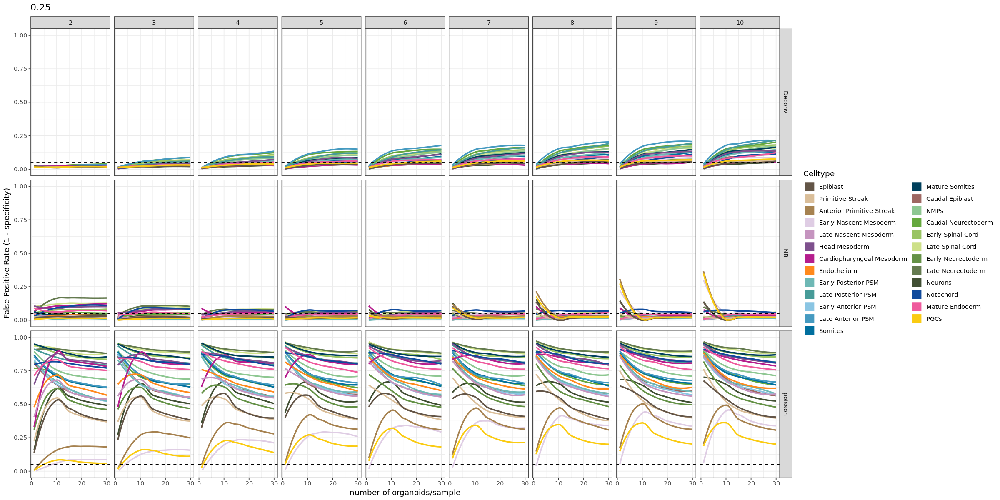

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



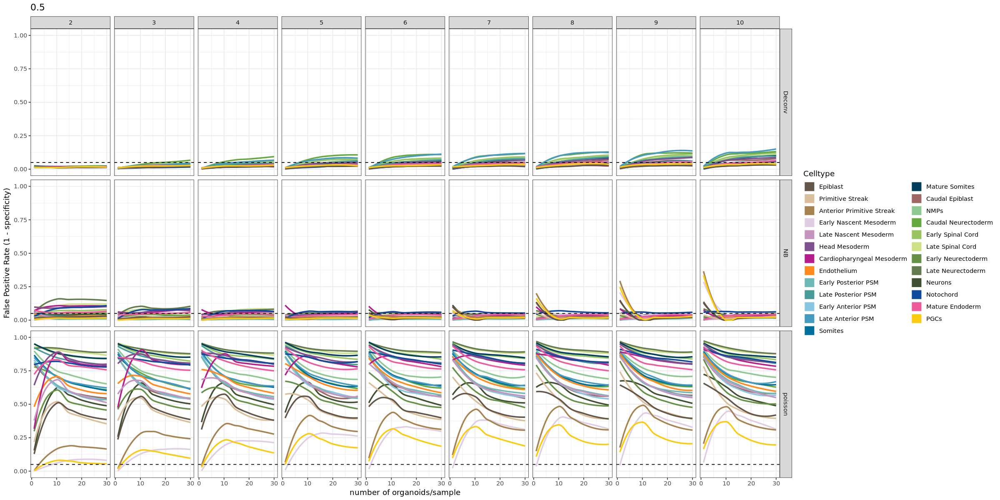

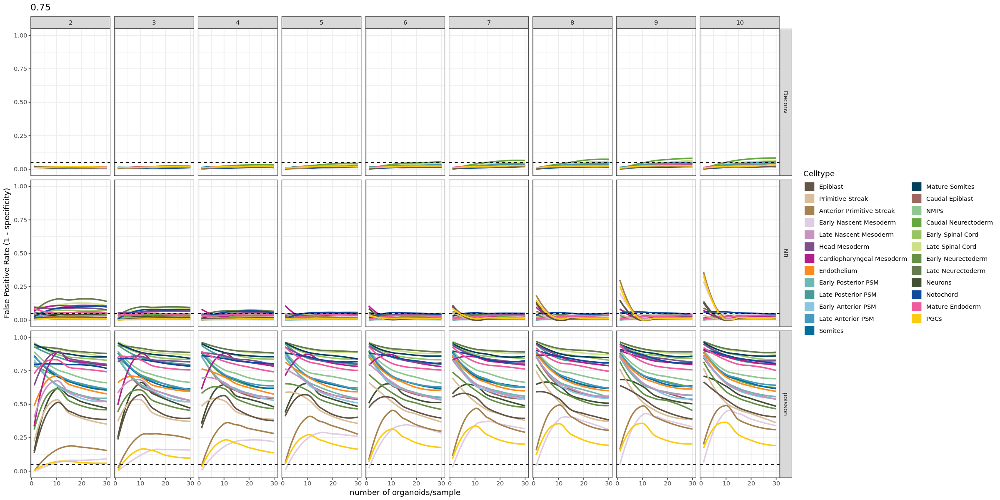

In [11]:
options(repr.plot.width=10, repr.plot.height=5)
cols <- c('ct_perturb', 'celltype', 'IoD', 'IoD_contr', 'sim_type', 'cells_per_samp',
          'timepoint', 'DA_meth', 'norg', 'nsamp', 'fc'
         )
to.plot <- copy(out)
to.plot <- to.plot[ct_perturb != celltype,
               FPR := mean(discovery),
               by=cols
              ]
to.plot <- to.plot[ct_perturb != celltype, .SD, .SDcols=c('FPR',cols)] %>% unique
to.plot$celltype <- factor(to.plot$celltype, levels = rev(cluster_order))
to.plot$ct_perturb <- factor(to.plot$ct_perturb, levels = rev(cluster_order))
options(repr.plot.width=20, repr.plot.height=10)
for (foldchange in unique(to.plot$fc)) {
    p <- ggplot(data=to.plot[fc == foldchange], mapping = aes(x=norg, y=FPR, colour=celltype)) +
      #geom_line() +
      #geom_smooth(se=TRUE, mapping = aes(fill=celltype)) +
      geom_smooth(se=FALSE, mapping = aes(fill=celltype)) +
      ylim(0,1) +
      # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
      scale_colour_manual(values = cluster_colours, name = "Celltype") +
      labs(x="number of organoids/sample", y="False Positive Rate (1 - specificity)") +
      scale_fill_manual(values = cluster_colours) +
      #geom_hline(yintercept = 0.05, linetype='dashed') +
      ggtitle(foldchange) +
      geom_hline(yintercept = 0.05, linetype='dashed') +
      guides(colour = guide_legend(override.aes = list(size=6)), fill="none") +
      theme_bw() +
      #theme(legend.position = 'None') +
      facet_grid(DA_meth~nsamp)
    print(p)
}

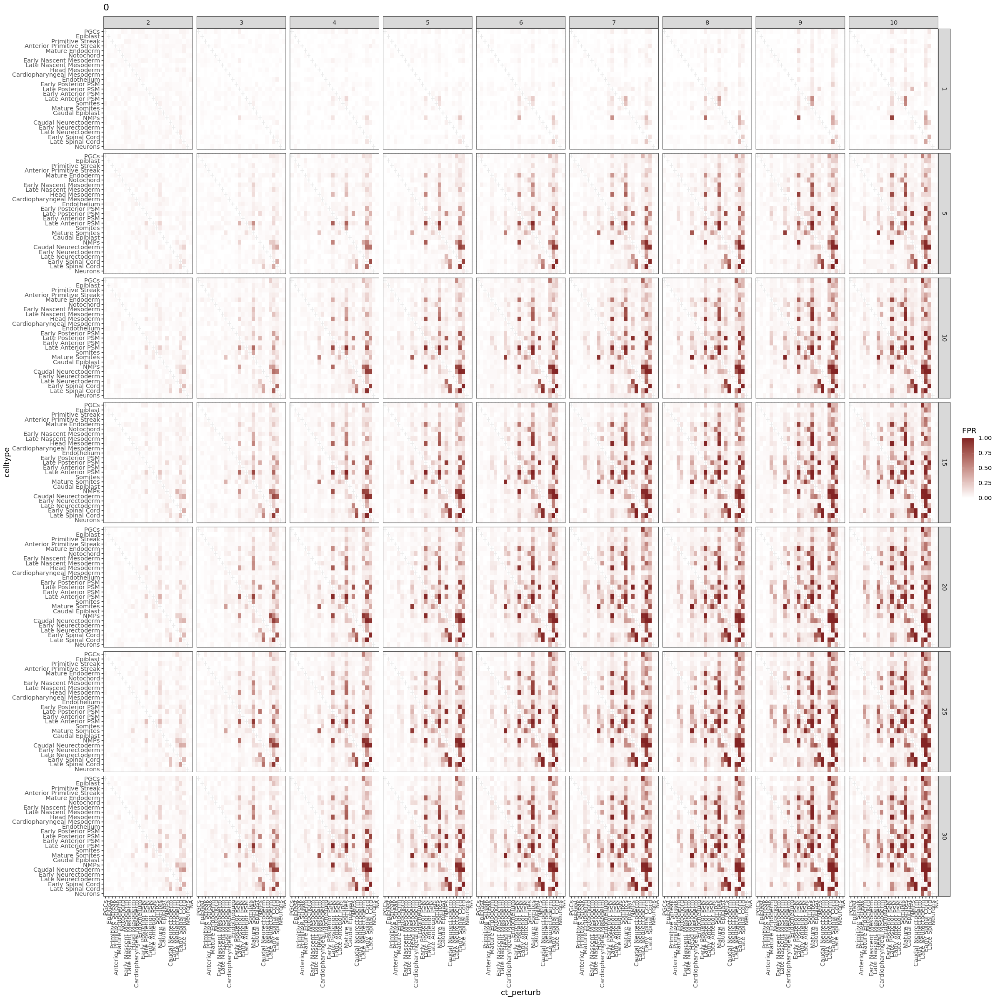

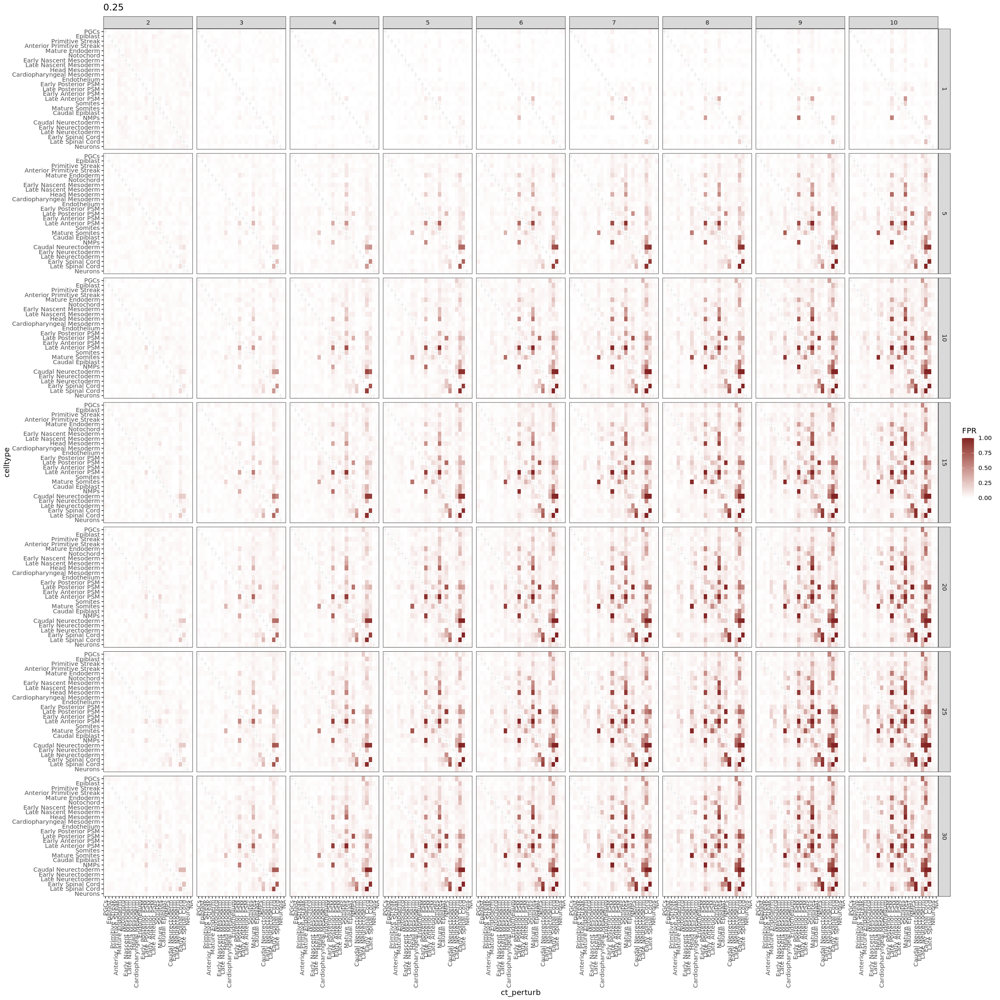

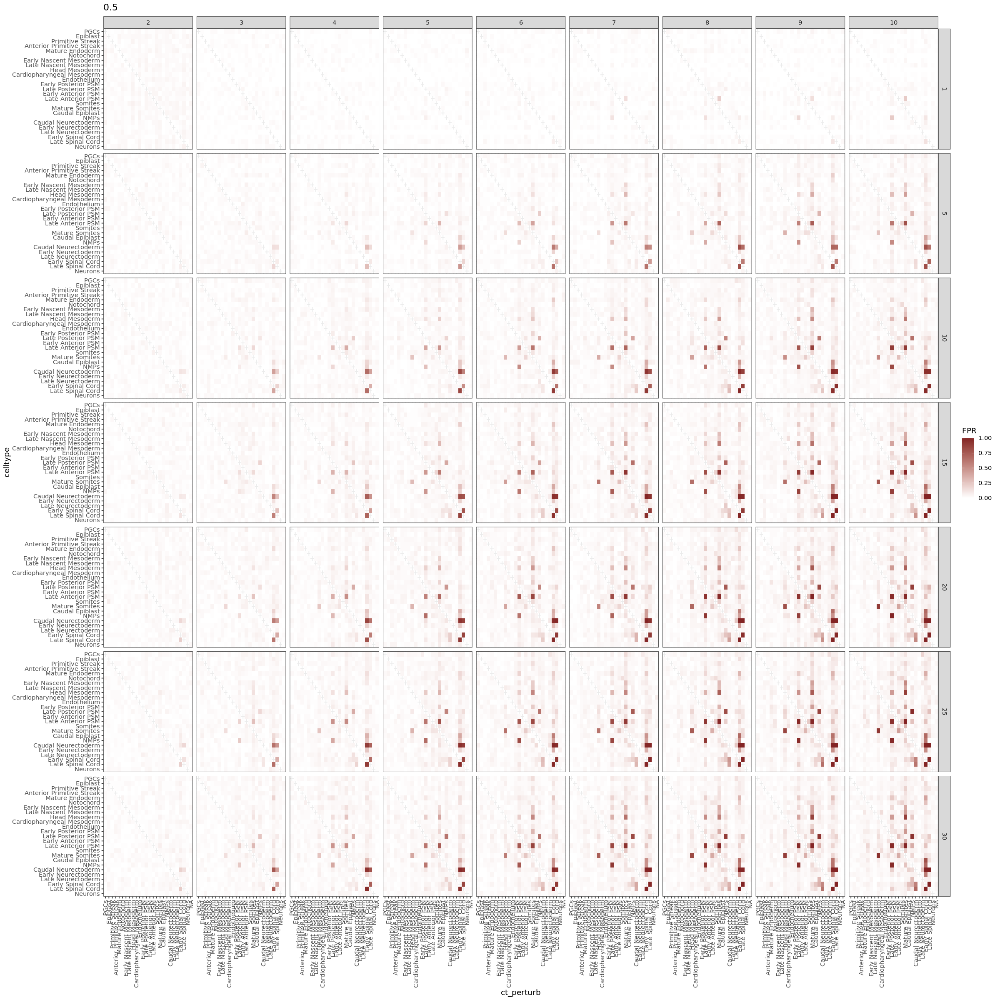

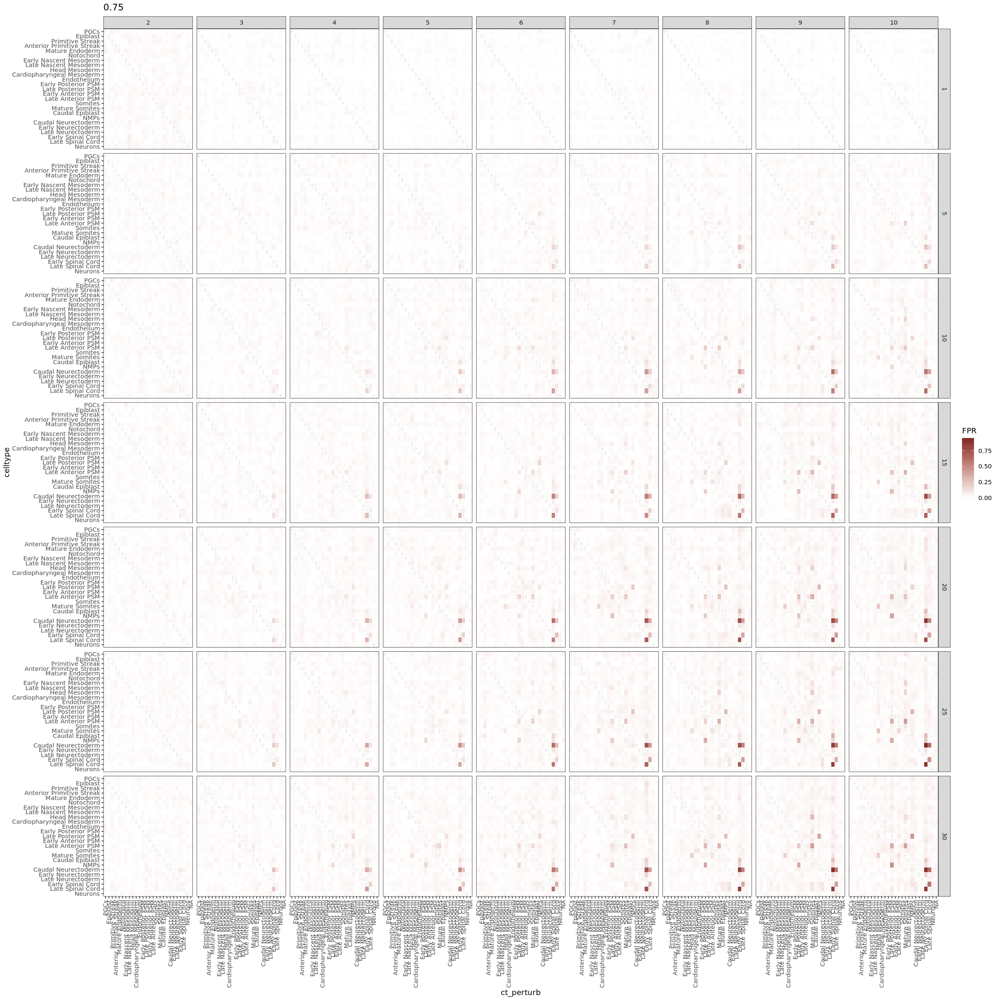

In [12]:
options(repr.plot.width=20, repr.plot.height=20)
to.plot$ct_perturb <- factor(to.plot$ct_perturb, levels = cluster_order)
for (foldchange in unique(to.plot$fc)) {
    p <- ggplot(data=to.plot[(fc == foldchange) & (DA_meth=="Deconv")], mapping = aes(x=ct_perturb, y=celltype, fill=FPR)) +
      geom_tile() +
      #labs(x="number of organoids/sample", y="False Positive Rate (1 - specificity)") +
      ggtitle(foldchange) +
      scale_fill_gradient(low="white", high=muted("red")) +
      theme_bw() +
      theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) +
      #theme(legend.position = 'None') +
      facet_grid(norg~nsamp)
    print(p)
}

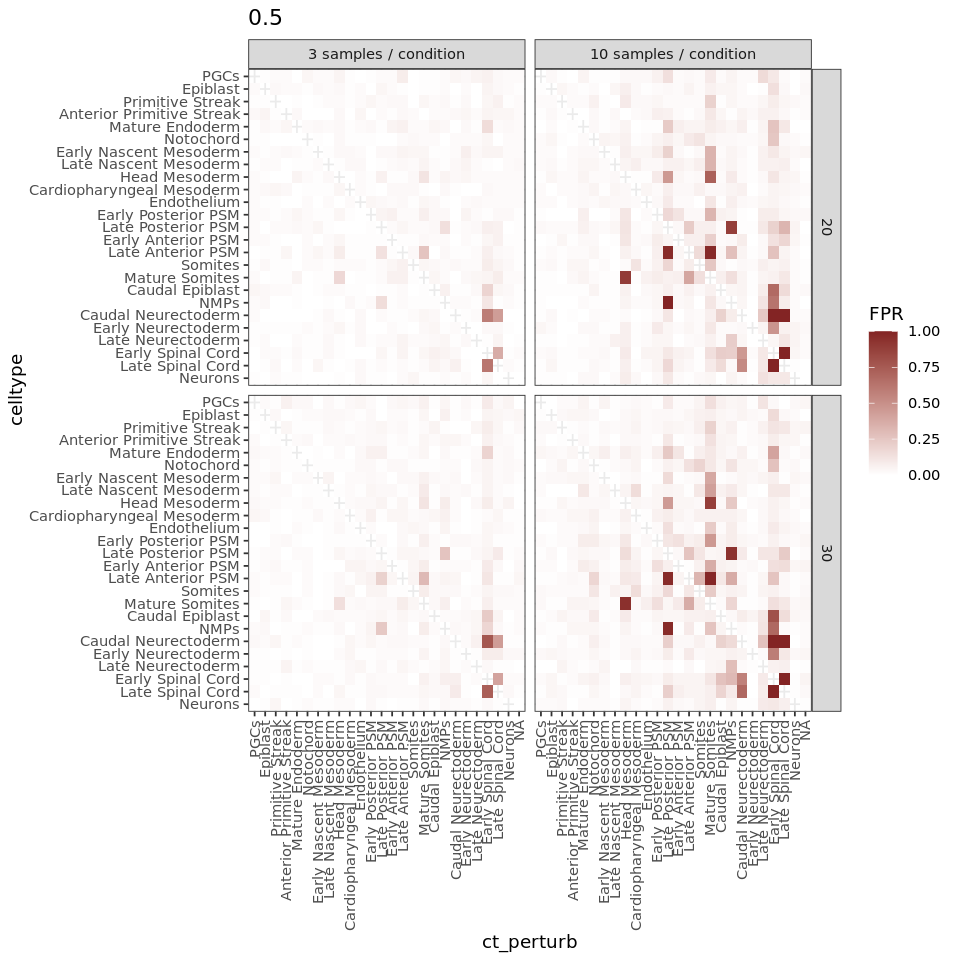

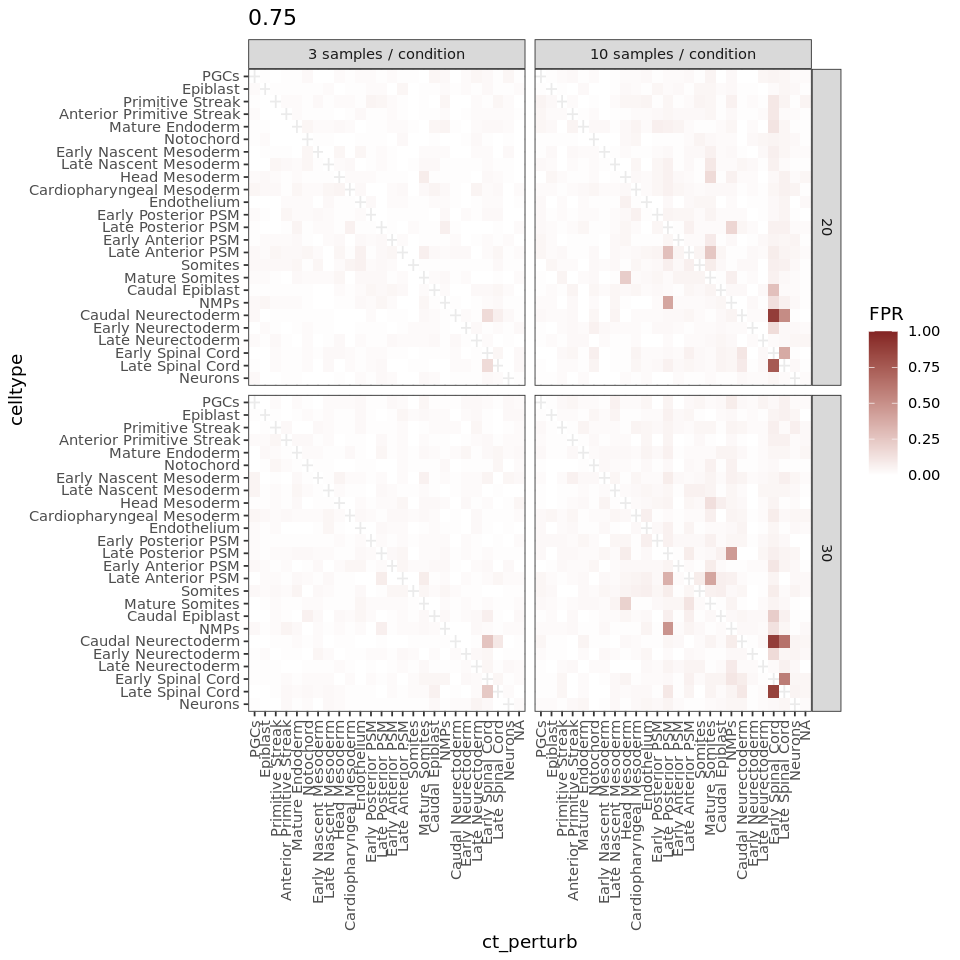

In [13]:
nsamp.labs <- c("3" = "3 samples / condition",
                  "6" = "6 samples / condition",
                  "10" = "10 samples / condition"
                 )
norg.labs <- c("10" = "10 organoids / sample",
                  "20" = "20 organoids / sample",
                  "30" = "30 organoids / sample"
                 )

options(repr.plot.width=8, repr.plot.height=8)
p <- ggplot(data=to.plot[(fc == 0.5) & (DA_meth=="Deconv") & (nsamp %in% c(3, 10)) & (norg %in% c(20, 30))], mapping = aes(x=ct_perturb, y=celltype, fill=FPR)) +
  geom_tile() +
  #labs(x="number of organoids/sample", y="False Positive Rate (1 - specificity)") +
  ggtitle(0.5) +
  scale_fill_gradient(low="white", high=muted("red"), limits = c(0,1)) +
  theme_bw() +
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) +
  #theme(legend.position = 'None') + +
  facet_grid(norg~nsamp, labeller = labeller(DA_meth = DA_meth.labs, nsamp = nsamp.labs))
print(p)

p <- ggplot(data=to.plot[(fc == 0.75) & (DA_meth=="Deconv") & (nsamp %in% c(3, 10)) & (norg %in% c(20, 30))], mapping = aes(x=ct_perturb, y=celltype, fill=FPR)) +
  geom_tile() +
  #labs(x="number of organoids/sample", y="False Positive Rate (1 - specificity)") +
  ggtitle(0.75) +
  scale_fill_gradient(low="white", high=muted("red"), limits = c(0,1)) +
  theme_bw() +
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) +
  #theme(legend.position = 'None') + +
  facet_grid(norg~nsamp, labeller = labeller(DA_meth = DA_meth.labs, nsamp = nsamp.labs))
print(p)

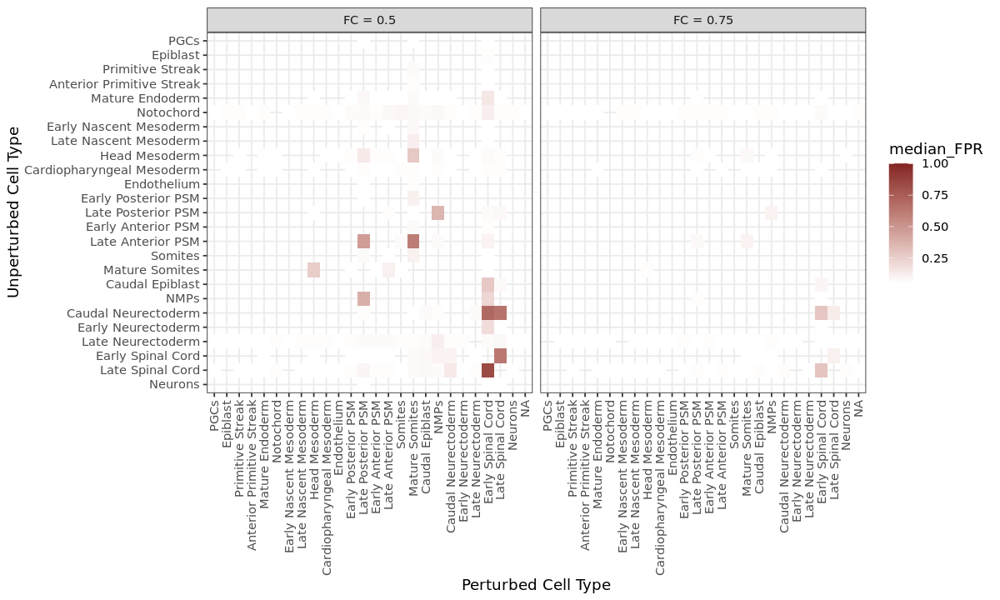

In [14]:
options(repr.plot.width=10, repr.plot.height=6)
to.plot2 <- copy(to.plot[(fc %in% c(0.5,0.75))])
to.plot2 <- to.plot2[,
                     median_FPR := median(FPR),
                     by=c("ct_perturb", "celltype", "fc")
                    ]
fc.labs <- c("0.5" = "FC = 0.5",
             "0.75" = "FC = 0.75"
            )
p <- ggplot(data=to.plot2, mapping = aes(x=ct_perturb, y=celltype, fill=median_FPR)) +
  geom_tile() +
  labs(x="Perturbed Cell Type", y="Unperturbed Cell Type") +
  scale_fill_gradient(low="white", high=muted("red"), limits = c(0.05,1), na.value = 'transparent') +
  theme_bw() +
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) +
  facet_wrap(~fc, nrow=1, labeller = labeller(fc = fc.labs))
print(p)
ggsave(
  paste0('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/final_plots/SuppFig9/B.pdf'),
  plot = p,
  device = 'pdf',
  width = 10,
  height = 6,
  units = "in"
)